# EDA on Drugs

![](first_meme.jpg)

Authors:

Patrick Neubert (Patrick.Neubert@t-online.de) 

Mia Reimer (mia.reimer@googlemail.com)

![](data/first_meme.jpg)

## Intention

The aim of this EDA is to train a machine learning model, which predicts the probability of drug abuse for single individuals. 
The model is based on a dataset containing demographic information (e.g. gender, age, education), infomation about personality traits (standardized test e.g. NEO-FFI-R, BIS-11, ImpSS), as well as a detailed overview over the consumption of 18 different drugs. 

The model is the core of the newly developed app 'pyCHEDELICS Pro', which offers the opportunity for everyone to quickly check if they have a predisposition for durg abuse. 

## Import 

### Packages / Modules

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
import sklearn
import missingno

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
#from sklearn.ensemble import StackingClassifier      (currently not in use)
from mlxtend.classifier import StackingCVClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz  
from subprocess import call
from IPython.display import Image

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score, fbeta_score
from sklearn.metrics import make_scorer
from sklearn.tree import DecisionTreeClassifier

pd.set_option('display.float_format', lambda x: '%.5f' % x)

### Datset

Link to Dataset: https://archive.ics.uci.edu/ml/datasets/Drug+consumption+%28quantified%29

| Column Name | Description | Type | Others | 
|-------------|-------------|------|--------|
| ID | Reference Nb. | Numerical | |
| Age | Age Categories | Categorical | 6 values| 
| Gender | Gender | Categorical | Female = Positive, Male = negative|
| Education | Education Level | Categorical | 9 values|
| Country | Country | Categorical | 7 values | 
| Ethnicity | Ethnicity | Categorical | 7 values |
| Nscore | Neuroticism | Categorical | 'einige'|
| EScore | Extraversion | Categorical | 'einige' |
| OScore | Openness to Experience | Categorical | 'einige' |
| AScore | Agreeableness (Kompromissbereit) | Categorical | 'einige' |
| Cscore | Conscientiousness (Gewissenhaftigkeit) | Categorical | 'einige' |
| Impulsive | Impulsive | Categorical |10 values |
| SS | sensation seeing (neugierig) | Categorical |11 values |
| Alcohol | Alcohol consumption | Categorical |CL0 to CL6 |
| Amphet | Amphetamines consumption | Categorical |CL0 to CL6 |
| Amyl | amyl nitrite consumption | Categorical |CL0 to CL6 |
| Benzos | benzodiazepine consumption | Categorical |CL0 to CL6 |
| Caff | caffeine consumption | Categorical |CL0 to CL6 |
| Cannabis | cannabis consumption | Categorical |CL0 to CL6 |
| Choc | chocolate consumption | Categorical |CL0 to CL6 |
| Coke | cocaine consumption | Categorical |CL0 to CL6 |
| Crack | crack consumption |  Categorical |CL0 to CL6 |
| Ecstasy | ecstasy consumption|  Categorical |CL0 to CL6 |
| Heroin |heroin consumption | Categorical |CL0 to CL6 |
| Ketamine | ketamine consumption | Categorical |CL0 to CL6 |
| Legalh |  legal highs consumption | Categorical |CL0 to CL6 |
| LSD | LSD consumption | Categorical |CL0 to CL6 |
| Meth | methadone consumption | Categorical |CL0 to CL6 |
| Shrooms | magic mushrooms consumption | Categorical |CL0 to CL6 |
| Nicotine | nicotine consumption | Categorical |CL0 to CL6 |
| Semer | fictitious drug Semeron consumption | Categorical |CL0 to CL6 |
| VSA | volatile substance abuse consumption | Categorical |CL0 to CL6 |

In [2]:
# Load data to a dataframe
df = pd.read_csv('data/drug_consumption.csv', delimiter=";")
print('The dataframe consist of {} rows and {} columns.'.format(df.shape[0], df.shape[1]))
df.head()

The dataframe consist of 1885 rows and 32 columns.


,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA
0,1,"0,49788","0,48246","-0,05921","0,96082","0,126","0,31287","-0,57545","-0,58331","-0,91699",...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,"-0,07854","-0,48246","1,98437","0,96082","-0,31685","-0,67825","1,93886","1,43533","0,76096",...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,"0,49788","-0,48246","-0,05921","0,96082","-0,31685","-0,46725","0,80523","-0,84732","-1,6209",...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,"-0,95197","0,48246","1,16365","0,96082","-0,31685","-0,14882","-0,80615","-0,01928","0,59042",...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,"0,49788","0,48246","1,98437","0,96082","-0,31685","0,73545","-1,6334","-0,45174","-0,30172",...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0


In [3]:
# Info about dtypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1885 entries, 0 to 1884
Data columns (total 32 columns):
ID           1885 non-null int64
Age          1885 non-null object
Gender       1885 non-null object
Education    1885 non-null object
Country      1885 non-null object
Ethnicity    1885 non-null object
Nscore       1885 non-null object
Escore       1885 non-null object
Oscore       1885 non-null object
Ascore       1885 non-null object
Cscore       1885 non-null object
Impulsive    1885 non-null object
SS           1885 non-null object
Alcohol      1885 non-null object
Amphet       1885 non-null object
Amyl         1885 non-null object
Benzos       1885 non-null object
Caff         1885 non-null object
Cannabis     1885 non-null object
Choc         1885 non-null object
Coke         1885 non-null object
Crack        1885 non-null object
Ecstasy      1885 non-null object
Heroin       1885 non-null object
Ketamine     1885 non-null object
Legalh       1885 non-null object
LSD       

In [4]:
# Returning all Column Names 
df.columns

Index(['ID', 'Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore',
       'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol',
       'Amphet', 'Amyl', 'Benzos', 'Caff', 'Cannabis', 'Choc', 'Coke', 'Crack',
       'Ecstasy', 'Heroin', 'Ketamine', 'Legalh', 'LSD', 'Meth', 'Shrooms',
       'Nicotine', 'Semer', 'VSA'],
      dtype='object')

## Data Cleaning

### Missing Values

The dataset containes no missing values. 

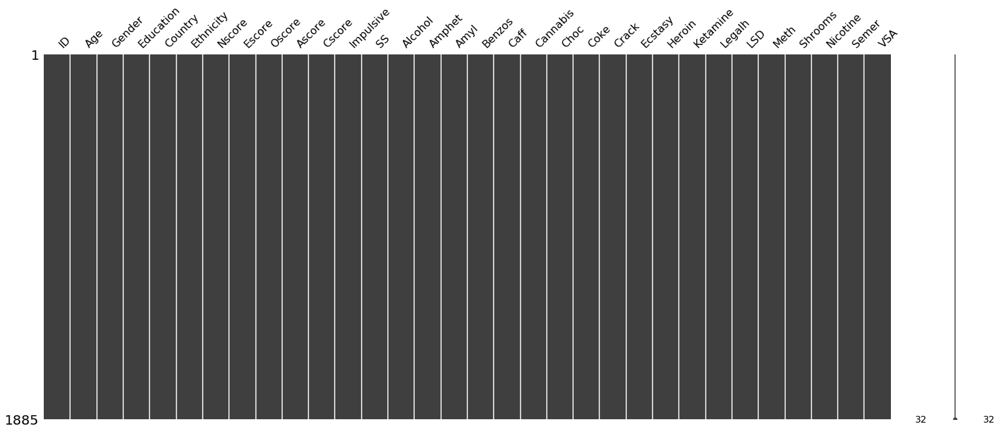

In [5]:
missingno.matrix(df);

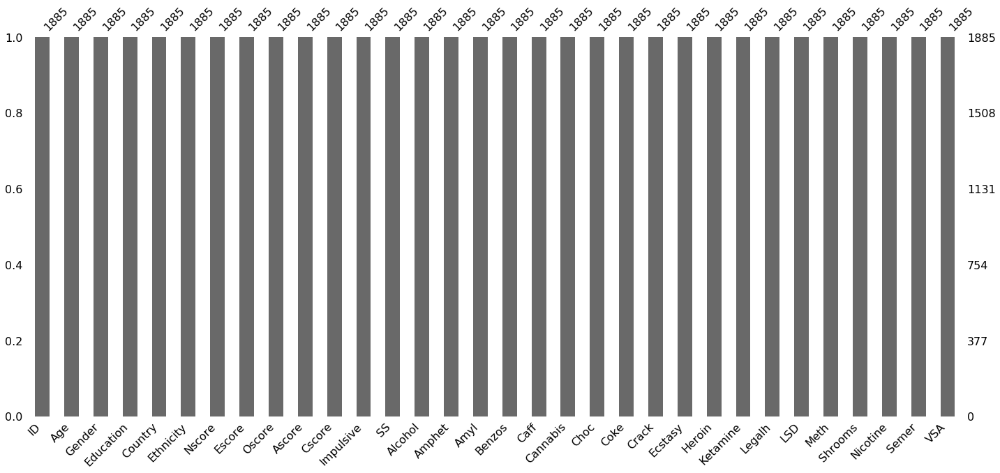

In [6]:
missingno.bar(df);

### Converting problematic entries

The dataframe contains some columns with non-numerical entries as well as commas as decimal seperators. Those were replaced respectivley converted for further processing steps.

In [7]:
# Required Columns to List
col = df.columns.tolist()[13:]

In [8]:
# Deleting CL
for column in col:
    df[column].replace({'CL0': 0, 'CL1': 1, 'CL2': 2, 'CL3': 3, 'CL4': 4, 'CL5': 5, 'CL6': 6}, inplace=True)        
    

In [9]:
# Converting objects to floats
col_obj =  df.columns.tolist()[:13]
for column in col_obj:
    df[column] = df[column].apply(lambda x: str(x).replace(',','.'))


In [10]:
for column in col_obj:
    df[column] = df[column].astype(float)

In [11]:
df.head(n=2)

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA
0,1.00000,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,...,0,0,0,0,0,0,0,2,0,0
1,2.00000,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,...,4,0,2,0,2,3,0,4,0,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1885 entries, 0 to 1884
Data columns (total 32 columns):
ID           1885 non-null float64
Age          1885 non-null float64
Gender       1885 non-null float64
Education    1885 non-null float64
Country      1885 non-null float64
Ethnicity    1885 non-null float64
Nscore       1885 non-null float64
Escore       1885 non-null float64
Oscore       1885 non-null float64
Ascore       1885 non-null float64
Cscore       1885 non-null float64
Impulsive    1885 non-null float64
SS           1885 non-null float64
Alcohol      1885 non-null int64
Amphet       1885 non-null int64
Amyl         1885 non-null int64
Benzos       1885 non-null int64
Caff         1885 non-null int64
Cannabis     1885 non-null int64
Choc         1885 non-null int64
Coke         1885 non-null int64
Crack        1885 non-null int64
Ecstasy      1885 non-null int64
Heroin       1885 non-null int64
Ketamine     1885 non-null int64
Legalh       1885 non-null int64
LSD      

## Data Exploration 

Visualization of different parts of the dataframe provides a first overview over the properties and distribution of the various features.

### Plotting

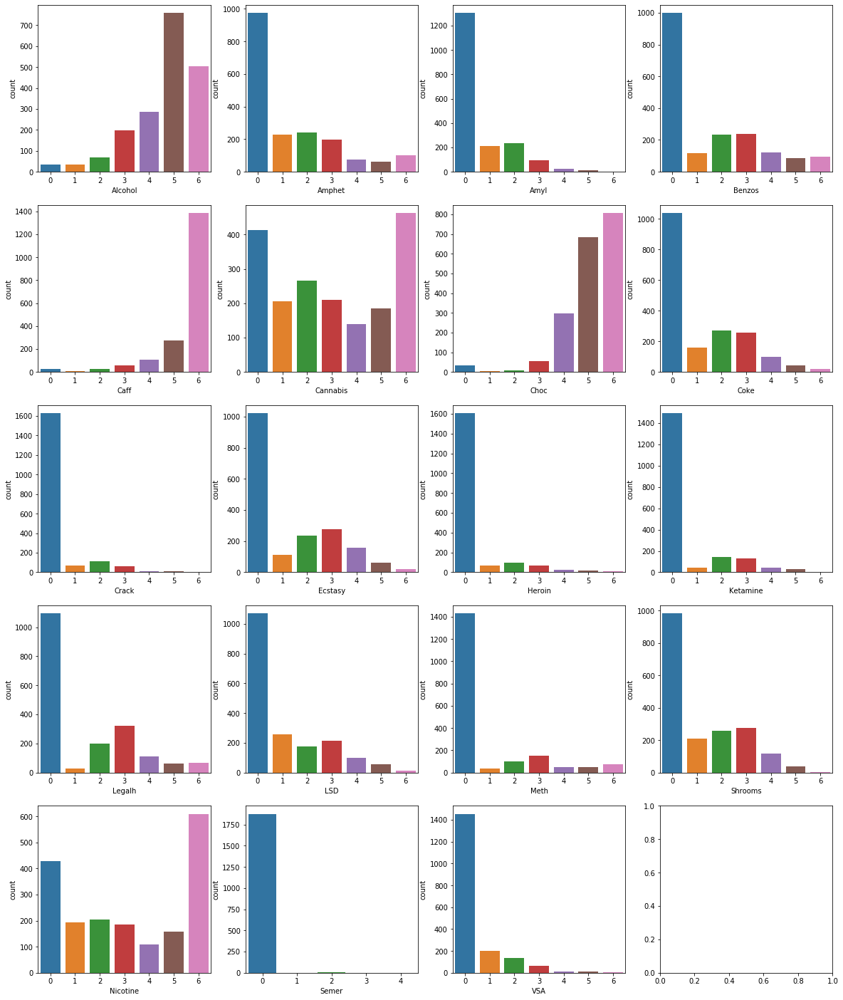

In [13]:
# Countplots of Drug Use Features 
f, axes = plt.subplots(5, 4, figsize=(20, 25))
sns.countplot(df.Alcohol, ax=axes[0][0]);
sns.countplot(df.Amphet, ax=axes[0][1]);
sns.countplot(df.Amyl, ax=axes[0][2]);
sns.countplot(df.Benzos, ax=axes[0][3]);
sns.countplot(df.Caff, ax=axes[1][0]);
sns.countplot(df.Cannabis, ax=axes[1][1]);
sns.countplot(df.Choc, ax=axes[1][2]);
sns.countplot(df.Coke, ax=axes[1][3]);
sns.countplot(df.Crack, ax=axes[2][0]);
sns.countplot(df.Ecstasy, ax=axes[2][1]);
sns.countplot(df.Heroin, ax=axes[2][2]);
sns.countplot(df.Ketamine, ax=axes[2][3]);
sns.countplot(df.Legalh, ax=axes[3][0]);
sns.countplot(df.LSD, ax=axes[3][1]);
sns.countplot(df.Meth, ax=axes[3][2]);
sns.countplot(df.Shrooms, ax=axes[3][3]);
sns.countplot(df.Nicotine, ax=axes[4][0]);
sns.countplot(df.Semer, ax=axes[4][1]);
sns.countplot(df.VSA, ax=axes[4][2]);


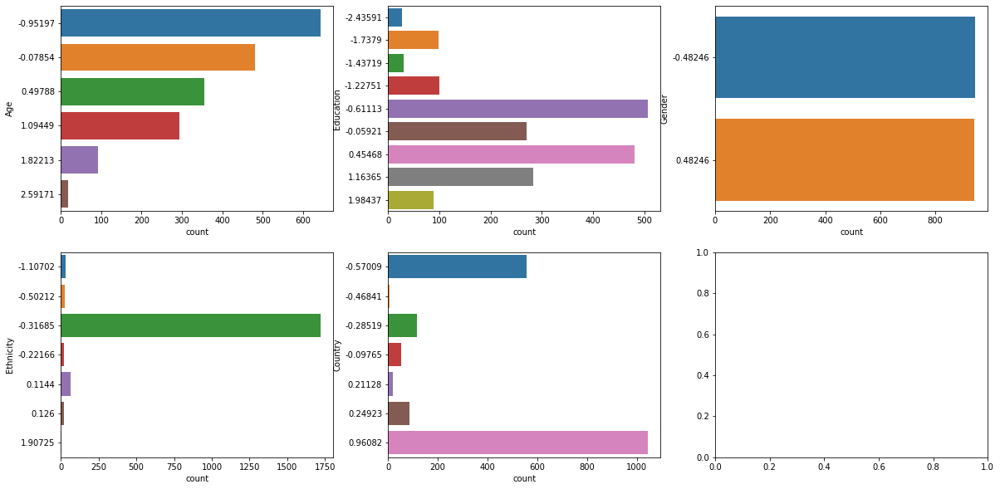

In [14]:
# Plots of Personal Information
f, axes = plt.subplots(2, 3, figsize=(20, 10))
sns.countplot(y=df.Age, ax=axes[0][0]);
sns.countplot(y=df.Education, ax=axes[0][1]);
sns.countplot(y=df.Gender, ax=axes[0][2]);
sns.countplot(y=df.Ethnicity, ax=axes[1][0]);
sns.countplot(y=df.Country, ax=axes[1][1]);

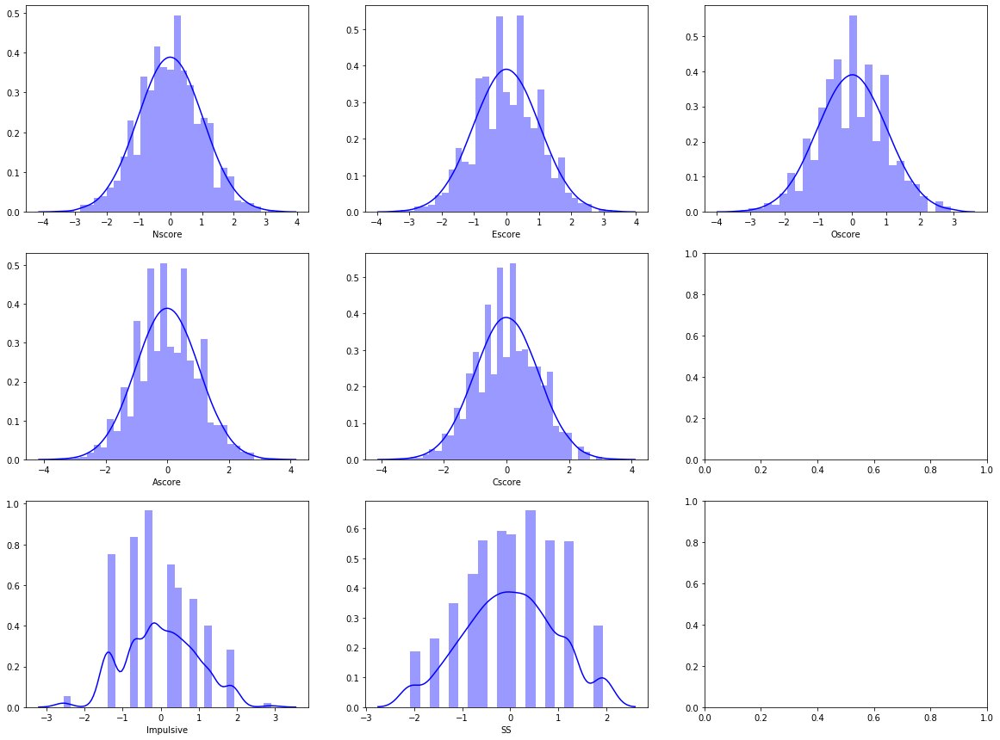

In [15]:
# Histograms for Personality Scores and Features to evaluate distribution of values 
f, axes = plt.subplots(3, 3, figsize=(20, 15))
sns.distplot(df.Nscore, color='b', ax=axes[0][0]);
sns.distplot(df.Escore, color='b', ax=axes[0][1]);
sns.distplot(df.Oscore, color='b', ax=axes[0][2]);
sns.distplot(df.Ascore, color='b', ax=axes[1][0]);
sns.distplot(df.Cscore, color='b', ax=axes[1][1]);
sns.distplot(df.Impulsive, color='b', ax=axes[2][0]);
sns.distplot(df.SS, color='b', ax=axes[2][1]);

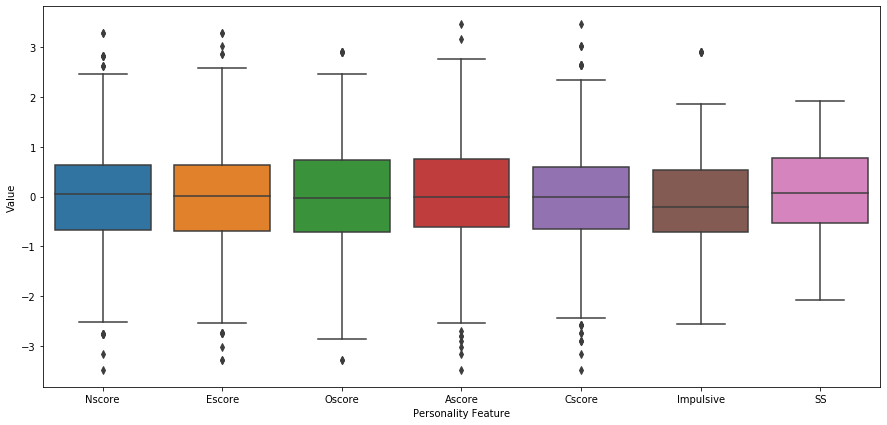

In [16]:
# Boxplot for Personality Traits (reveals the presence of outliers)
df_scores = df.iloc[:, 6:13]
plt.figure(figsize=(15,7))
sns.boxplot(x="variable", y="value", data=pd.melt(df_scores));
plt.xlabel('Personality Feature');
plt.ylabel('Value');

## Feature Engineering

### Deleting and Creating Columns

Based on the definition of https://drogen.wikia.org/de/wiki/Harte_und_weiche_Drogen the 18 drugs were devided in three categories. 

Soft Drugs (Socially accepted): Alcohol, Caffein, Chocolate, Nicotine

Medium Drug: Cannabis, Shrooms, LSD, Legalh, Ketamine, Ecstasy, VSA, Benzos, Amyl 

Hard Drug: Coke, Crack, Meth, Heroin, Amphet,  

(Semeron ('Semer') is excluded since it is a fictitious drug, which was included in the survey to identify over-claimers.)

In [17]:
# Deleting ID Column
df_new = df.drop('ID', axis=1)

In [18]:
# Drop Instances from People who claimed to take Semer
df_new.drop([727, 817, 1516, 1533, 1698, 1769, 1806, 1823] , axis=0, inplace=True)

In [19]:
# Double-check
df_new[df_new['Semer'] != 0]

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA


In [20]:
# Creating new Column "Hard" Drug
df_new['Hard'] = df.Coke + df.Crack + df.Heroin + df.Meth + df.Amphet
Hard_list = df_new.Hard.tolist()
Hard_new = [0 if x == 0 else 1 for x in Hard_list]
df_new['Hard'] = Hard_new

In [21]:
# Creating new Column "Medium" Drug
df_new['Medium'] = df.Cannabis + df.Shrooms + df.LSD + df.Legalh + df.Ketamine + df.Ecstasy + df.VSA + df.Benzos + df.Amyl
Medium_list = df_new.Medium.tolist()
Medium_new = [0 if x == 0 else 1 for x in Medium_list]
df_new['Medium'] = Medium_new

In [22]:
# Creating new Column "Soft" Drug
df_new['Soft'] = df.Caff + df.Choc + df.Alcohol + df.Nicotine
Soft_list = df_new.Soft.tolist()
Soft_new = [0 if x == 0 else 1 for x in Soft_list]
df_new['Soft'] = Soft_new

In [23]:
# Checking the Dataframe 
df_new.head(n=2)

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,0,2,0,0,1,1,1
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,0,2,3,0,4,0,0,1,1,1


In [24]:
# Only Person who never used any of the aforementioned drugs 
df_new[df_new['Soft'] == 0]

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft
1277,-0.95197,-0.48246,0.45468,0.96082,-0.50212,0.82562,0.63779,-0.84732,-2.21844,0.93949,...,0,0,0,0,0,0,0,0,0,0


In [25]:
# Removing the non-drug user from dataset
df_new = df_new.drop([1277] , axis=0)

In [26]:
# Double-check
df_new[df_new['Soft'] == 0]

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft


In [27]:
# Check for people who stated to take Hard drugs without have taken Medium drugs
df_new.query("Hard == 1 and Medium == 0")

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft
107,0.49788,0.48246,-1.73790,0.96082,-0.31685,0.13606,0.00332,-1.27553,-0.76096,0.58489,...,0,0,0,0,6,0,0,1,0,1
168,-0.07854,0.48246,0.45468,0.96082,-0.31685,0.22393,1.28610,-1.27553,-0.30172,-1.13788,...,0,0,0,0,1,0,0,1,0,1
392,-0.07854,0.48246,-0.05921,0.96082,-0.31685,-0.79151,-0.15487,-2.21069,-0.60633,1.46191,...,0,0,0,0,0,0,0,1,0,1
819,-0.95197,-0.48246,-0.61113,0.96082,-0.31685,-0.05188,1.11406,0.72330,-0.45321,0.41594,...,0,0,6,0,0,0,0,1,0,1
1081,-0.95197,0.48246,1.16365,0.96082,-0.31685,0.62967,1.11406,-0.84732,-0.45321,-1.25773,...,0,0,0,0,0,0,0,1,0,1
1195,-0.07854,-0.48246,0.45468,0.24923,-0.31685,-0.92104,-0.30033,-0.17779,-1.92595,-0.27607,...,0,0,6,0,0,0,0,1,0,1


In [28]:
# Removing this 6 people for converting the dataset into categorical values
df_new = df_new.drop([107, 168, 392, 819, 1081, 1195] , axis=0)

In [29]:
# Double-check
df_new.query("Hard == 1 and Medium == 0")

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Legalh,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft


In [30]:
# Combining to get the labels for drug categories

df_drugtype = df_new['Soft'] + df_new['Medium'] + df_new['Hard']
df_drugtype.unique()

array([3, 2, 1])

In [31]:
# 3 is Hard drug user, 2 is Medium drug user, 1 is soft drug user

df_new["Drugtype"] = df_drugtype
df_new.head(n=2)

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft,Drugtype
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,2,0,0,1,1,1,3
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,2,3,0,4,0,0,1,1,1,3


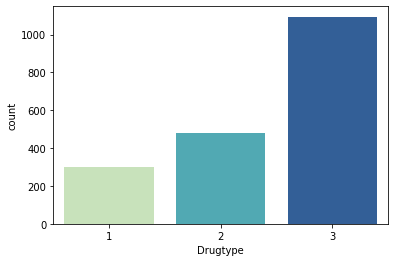

In [32]:
# Drugtype abundancy
sns.countplot(df_new.Drugtype, palette='YlGnBu');
plt.savefig('figures/countplot_drugtype', transparent=True, dpi=200)

### Creating Dummies

To asure the data fits best our modell prediction we decided to make dummies of certain features.

#### Dummies Age 

In [33]:
age_dummies = pd.get_dummies(df_new.Age, drop_first=True)

In [34]:
#change column names to real categories

age = ["Age_25-34", "Age_35-44", "Age_45-54", "Age_55-64", "Age_65+"]
age_dummies.columns = age
age_dummies.head()

,Age_25-34,Age_35-44,Age_45-54,Age_55-64,Age_65+
0,0,1,0,0,0
1,1,0,0,0,0
2,0,1,0,0,0
3,0,0,0,0,0
4,0,1,0,0,0


#### Dummies Education

In [35]:
education_dummies = pd.get_dummies(df_new.Education, drop_first=True)

In [36]:
#change column names to real categories

education = ["ls_16", "ls_17", "ls_18", "no_degree", "diploma", "university", "master", "doctorate"]
education_dummies.columns = education
education_dummies.head()

,ls_16,ls_17,ls_18,no_degree,diploma,university,master,doctorate
0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,1
2,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1


#### Dummies Country

In [37]:
country_dummies = pd.get_dummies(df_new.Country, drop_first=True)

In [38]:
#change column names to real categories

country = ["new_zealand", "other_c", "australia", "ireland", "canada", "UK"]
country_dummies.columns = country
country_dummies.head()

,new_zealand,other_c,australia,ireland,canada,UK
0,0,0,0,0,0,1
1,0,0,0,0,0,1
2,0,0,0,0,0,1
3,0,0,0,0,0,1
4,0,0,0,0,0,1


#### Dummies Ethnicity

In [39]:
ethnicity_dummies = pd.get_dummies(df_new.Ethnicity, drop_first=True)

In [40]:
#change column names to real categories

ethnicity = ["asian", "white", "black_white", "other_e", "white_asian", "black_asian"]
ethnicity_dummies.columns = ethnicity
ethnicity_dummies.head()

,asian,white,black_white,other_e,white_asian,black_asian
0,0,0,0,0,1,0
1,0,1,0,0,0,0
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,0,1,0,0,0,0


#### Conversion of Gender

In [41]:
# converting values for gender into 1 (female) and 0 (male)

Gender_list = df_new['Gender'].tolist()
Female = [0 if x < 0 else 1 for x in Gender_list]

df_new['Gender'] = Female
df_new.rename(columns={'Gender': 'Female'}, inplace=True) 

df_new.head(n=2)

,Age,Female,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft,Drugtype
0,0.49788,1,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,2,0,0,1,1,1,3
1,-0.07854,0,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,2,3,0,4,0,0,1,1,1,3


#### Merging of Dataframes

In [42]:
# drop "old features" 

drop_columns = ["Age", "Education", "Country", "Ethnicity"]

df_dummies = df_new.drop(drop_columns, axis=1)
df_dummies.head()

,Female,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,...,LSD,Meth,Shrooms,Nicotine,Semer,VSA,Hard,Medium,Soft,Drugtype
0,1,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,5,2,...,0,0,0,2,0,0,1,1,1,3
1,0,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,5,2,...,2,3,0,4,0,0,1,1,1,3
2,0,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,6,0,...,0,0,1,0,0,0,0,1,1,2
3,1,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,4,0,...,0,0,0,2,0,0,1,1,1,3
4,1,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,4,1,...,0,0,2,2,0,0,1,1,1,3


In [43]:
# Merge dataframe and dummie variables 

df_dummies = pd.concat([df_dummies, age_dummies, education_dummies, country_dummies, ethnicity_dummies], axis=1)
df_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1870 entries, 0 to 1884
Data columns (total 56 columns):
Female         1870 non-null int64
Nscore         1870 non-null float64
Escore         1870 non-null float64
Oscore         1870 non-null float64
Ascore         1870 non-null float64
Cscore         1870 non-null float64
Impulsive      1870 non-null float64
SS             1870 non-null float64
Alcohol        1870 non-null int64
Amphet         1870 non-null int64
Amyl           1870 non-null int64
Benzos         1870 non-null int64
Caff           1870 non-null int64
Cannabis       1870 non-null int64
Choc           1870 non-null int64
Coke           1870 non-null int64
Crack          1870 non-null int64
Ecstasy        1870 non-null int64
Heroin         1870 non-null int64
Ketamine       1870 non-null int64
Legalh         1870 non-null int64
LSD            1870 non-null int64
Meth           1870 non-null int64
Shrooms        1870 non-null int64
Nicotine       1870 non-null int64
Seme

### Correlation Matrix

In [44]:
# Comment in or out for changing df_new to df_dummie and back (Restart Kernal to make sure it works)

#df_new = df_dummies

In [45]:
df_corr = df_new.drop(col, axis=1)

In [46]:
drug_categories = ['Soft', 'Medium', 'Hard']
df_corr.drop(drug_categories, axis=1, inplace=True)

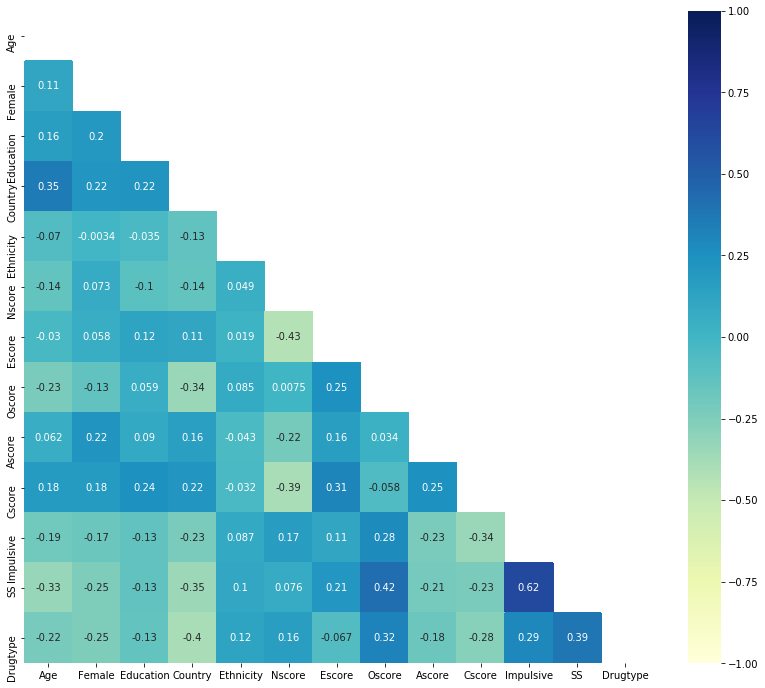

In [47]:
# Heatmap 
plt.figure(figsize=(14,12))
correlation = df_corr.corr()
matrix = np.triu(correlation)
heatmap = sns.heatmap(correlation, annot=True, center=0, vmin=-1, cmap='YlGnBu', mask=matrix)
plt.savefig('figures/heatmap', transparent=True, dpi=200)

### Personality Traits vs. Drugtype

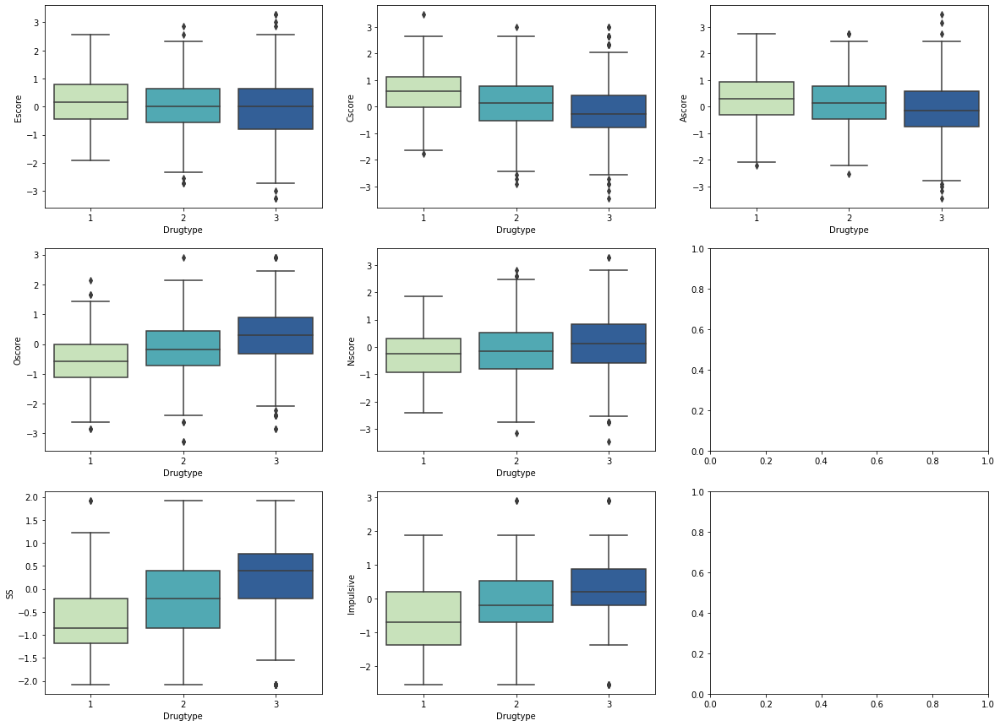

In [48]:
# Boxplot of personality traits vs. drugtype 
f, axes = plt.subplots(3, 3, figsize=(20, 15))
sns.boxplot(x='Drugtype', y='Oscore', palette='YlGnBu', data=df_new, ax=axes[1][0]);
sns.boxplot(x='Drugtype', y='Nscore', palette='YlGnBu', data=df_new, ax=axes[1][1]);
sns.boxplot(x='Drugtype', y='Ascore', palette='YlGnBu', data=df_new, ax=axes[0][2]);
sns.boxplot(x='Drugtype', y='Escore', palette='YlGnBu', data=df_new, ax=axes[0][0]);
sns.boxplot(x='Drugtype', y='Cscore', palette='YlGnBu', data=df_new, ax=axes[0][1]);
sns.boxplot(x='Drugtype', y='SS', palette='YlGnBu', data=df_new, ax=axes[2][0]);
sns.boxplot(x='Drugtype', y='Impulsive', palette='YlGnBu', data=df_new, ax=axes[2][1]);
plt.savefig('figures/boxplots_type_score', transparent=True, dpi=200)

## Predictive Modelling

For our purpose recall seems to be a good metric.
Since we want to detect and discourage potential future drug users it is important for us to indentify the majority of those people. 

It is a acceptable flaw if our model incorrectly classifies people with tendencies to soft or medium drugs as potential hard drug user.

In [49]:
# Helpful Functions 

# Function for plottin Classification Report and Confusion Matrix
def plot_eval(y_test, y_pred):
    print('Accuracy:', round(accuracy_score(y_test, y_pred), 3))
    print('----' * 15)
    print('Classification Report')
    print(classification_report(y_test, y_pred))
    print('----' * 15)
    print('Confusion Matrix')
    labels = ['1', '2', '3']
    cfm = confusion_matrix(y_test, y_pred)
    plt.figure()
    sns.heatmap(cfm, cmap='YlGnBu', annot=True, fmt='d', linewidths=.5, xticklabels=labels, yticklabels=labels);
    plt.ylabel('True label');
    plt.xlabel('Predicted label');

# Function for printing feature importance
def feature_importance(clf):
    feature_list = X.columns.tolist()
    importances = clf.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    feature_ranked = [feature_list[i] for i in indices]
    importances_ranked = [importances[indices[f]] for f in range(X.shape[1])]    
    list_combined = list(zip(feature_ranked, importances_ranked))  
    
    for f in range(X.shape[1]):
        print(list_combined[f])

In [50]:
# Feature Selection for regular dataset

#features = ['Age', 'Female', 'Education', 'Country', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS']

#X = df_new[features]
#y = df_new['Drugtype']

In [51]:
# Feature Selection for personality score dataset

#personality = ['Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS']

#X = df_new[personality]

#y = df_new['Drugtype']

In [52]:
# Feature Selection for dummy dataset

drug_types = ['Hard', 'Medium', 'Soft', 'Drugtype']


y = df_dummies['Drugtype']

X = df_dummies.drop(col, axis=1)
X.drop(drug_types, axis=1, inplace=True)


In [53]:
# Checking y
y.unique()

array([3, 2, 1])

In [54]:
# Checking X
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1870 entries, 0 to 1884
Data columns (total 33 columns):
Female         1870 non-null int64
Nscore         1870 non-null float64
Escore         1870 non-null float64
Oscore         1870 non-null float64
Ascore         1870 non-null float64
Cscore         1870 non-null float64
Impulsive      1870 non-null float64
SS             1870 non-null float64
Age_25-34      1870 non-null uint8
Age_35-44      1870 non-null uint8
Age_45-54      1870 non-null uint8
Age_55-64      1870 non-null uint8
Age_65+        1870 non-null uint8
ls_16          1870 non-null uint8
ls_17          1870 non-null uint8
ls_18          1870 non-null uint8
no_degree      1870 non-null uint8
diploma        1870 non-null uint8
university     1870 non-null uint8
master         1870 non-null uint8
doctorate      1870 non-null uint8
new_zealand    1870 non-null uint8
other_c        1870 non-null uint8
australia      1870 non-null uint8
ireland        1870 non-null uint8
cana

In [55]:
# Separating data for final evaluation (Eval-Testset)
X_modell, X_eval, y_modell, y_eval = train_test_split(X, y, test_size=0.15, random_state=1)

In [56]:
# X_model and X_eval 
print('Shape X_modell:', X_modell.shape)
print('Shape X_eval:', X_eval.shape)

Shape X_modell: (1589, 33)
Shape X_eval: (281, 33)


In [57]:
# Train Test Split
# More than 50 values per feature!
X_train, X_test, y_train, y_test = train_test_split(X_modell, y_modell, test_size=0.18, random_state=1)

In [58]:
# X_train and X_test
print('Shape X_train:', X_train.shape)
print('Shape X_test:', X_test.shape)

Shape X_train: (1302, 33)
Shape X_test: (287, 33)


### DummyClassifier

In [59]:
# DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, y_train)

y_pred_1 = dummy_clf.predict(X_test)

Accuracy: 0.568
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        42
           2       0.00      0.00      0.00        82
           3       0.57      1.00      0.72       163

    accuracy                           0.57       287
   macro avg       0.19      0.33      0.24       287
weighted avg       0.32      0.57      0.41       287

------------------------------------------------------------
Confusion Matrix


/Users/P_Neubert/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


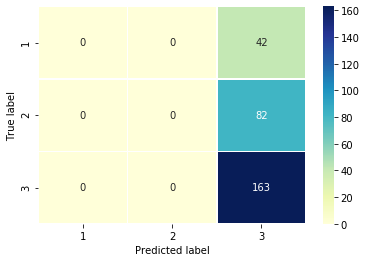

In [60]:
# Model Evaluation DummyClassifier
plot_eval(y_test, y_pred_1)

### Logistic Regression

In [61]:
# Logistic Regression 
LogReg = LogisticRegression(max_iter=150)
LogReg.fit(X_train, y_train)

y_pred_2 = LogReg.predict(X_test)
y_pred_2_probs = LogReg.predict_proba(X_test)    # Probability for each test instance 

Accuracy: 0.624
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.47      0.52      0.49        42
           2       0.36      0.11      0.17        82
           3       0.69      0.91      0.78       163

    accuracy                           0.62       287
   macro avg       0.51      0.51      0.48       287
weighted avg       0.56      0.62      0.57       287

------------------------------------------------------------
Confusion Matrix


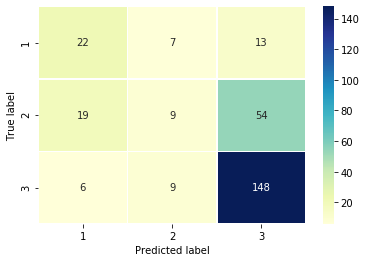

In [62]:
# Model Evaluation Logistic Regression
plot_eval(y_test, y_pred_2)

Accuracy: 0.677
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.56      0.57      0.56       210
           2       0.44      0.17      0.24       306
           3       0.73      0.91      0.81       786

    accuracy                           0.68      1302
   macro avg       0.58      0.55      0.54      1302
weighted avg       0.64      0.68      0.64      1302

------------------------------------------------------------
Confusion Matrix


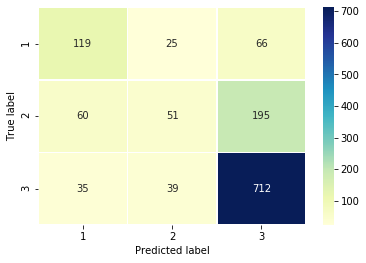

In [63]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_LogReg = LogReg.predict(X_train)
plot_eval(y_train, y_train_LogReg)

### SGDClassifier

In [64]:
# SGDClassifier to improve logisitc regression

sgdc = SGDClassifier(penalty='elasticnet', random_state=50, learning_rate='optimal')

sgdc.fit(X_train, y_train)

y_pred_3 = sgdc.predict(X_test)

Accuracy: 0.655
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.54      0.45      0.49        42
           2       0.60      0.15      0.24        82
           3       0.68      0.96      0.79       163

    accuracy                           0.66       287
   macro avg       0.61      0.52      0.51       287
weighted avg       0.64      0.66      0.59       287

------------------------------------------------------------
Confusion Matrix


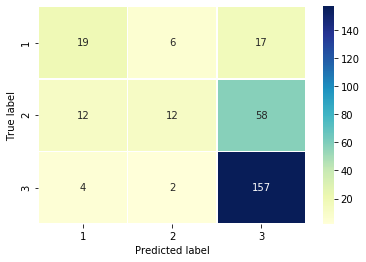

In [65]:
plot_eval(y_test, y_pred_3)

Accuracy: 0.666
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.53      0.42      0.47       210
           2       0.43      0.12      0.18       306
           3       0.71      0.94      0.81       786

    accuracy                           0.67      1302
   macro avg       0.56      0.50      0.49      1302
weighted avg       0.61      0.67      0.61      1302

------------------------------------------------------------
Confusion Matrix


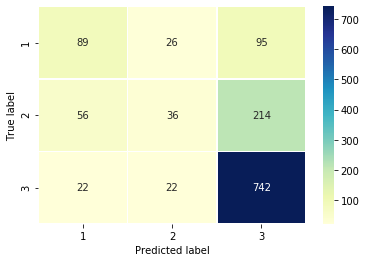

In [66]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_sgdc = sgdc.predict(X_train)
plot_eval(y_train, y_train_sgdc)

### Decision Tree

In [67]:
# Decision Tree
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

y_pred_4 = tree.predict(X_test)

In [68]:
print(f'Decision tree has {tree.tree_.node_count} nodes with maximum depth {tree.tree_.max_depth}.')

Decision tree has 741 nodes with maximum depth 19.


Accuracy: 0.491
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.22      0.26      0.24        42
           2       0.28      0.23      0.25        82
           3       0.65      0.68      0.67       163

    accuracy                           0.49       287
   macro avg       0.39      0.39      0.39       287
weighted avg       0.48      0.49      0.49       287

------------------------------------------------------------
Confusion Matrix


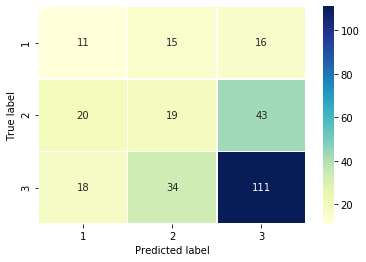

In [69]:
# Model Evaluation Decision Tree
plot_eval(y_test, y_pred_4)

Accuracy: 1.0
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       210
           2       1.00      1.00      1.00       306
           3       1.00      1.00      1.00       786

    accuracy                           1.00      1302
   macro avg       1.00      1.00      1.00      1302
weighted avg       1.00      1.00      1.00      1302

------------------------------------------------------------
Confusion Matrix


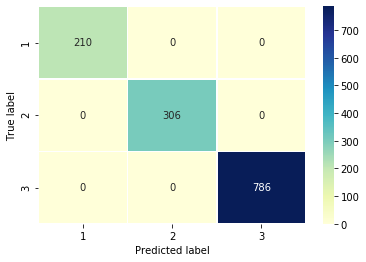

In [70]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_tree = tree.predict(X_train)
plot_eval(y_train, y_train_tree)

In [71]:
# Feature Importance Decision Tree
#feature_importance(tree)

In [72]:
# Export Tree from Decision Tree
feature_names = X.columns.tolist()
export_graphviz(tree, out_file = 'figures/dec_tree.dot', feature_names = feature_names, precision = 2, filled = True)

In [73]:
# Converting dot to png
call(['dot', '-Tpng', 'figures/dec_tree.dot', '-o', 'figures/dec_tree.png', '-Gdpi=100'])

0

In [74]:
# Display image
Image('figures/dec_tree.png')

### Random Forest

In [75]:
# Random Forest 
random_tree = RandomForestClassifier(random_state = 50)

random_tree.fit(X_train, y_train)

y_pred_5 = random_tree.predict(X_test)

In [76]:
n_nodes = []
max_depths = []

for ind_tree in random_tree.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 765
Average maximum depth 21


Accuracy: 0.61
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.41      0.43      0.42        42
           2       0.43      0.15      0.22        82
           3       0.67      0.89      0.77       163

    accuracy                           0.61       287
   macro avg       0.50      0.49      0.47       287
weighted avg       0.57      0.61      0.56       287

------------------------------------------------------------
Confusion Matrix


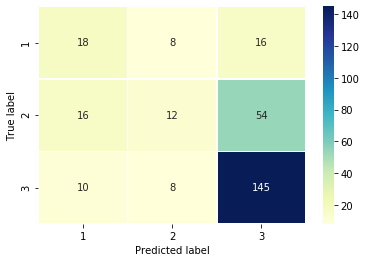

In [77]:
# Model Evaluation Randon Forest
plot_eval(y_test, y_pred_5)

Accuracy: 1.0
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       210
           2       1.00      1.00      1.00       306
           3       1.00      1.00      1.00       786

    accuracy                           1.00      1302
   macro avg       1.00      1.00      1.00      1302
weighted avg       1.00      1.00      1.00      1302

------------------------------------------------------------
Confusion Matrix


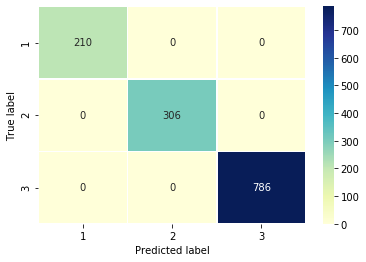

In [78]:
# Evaluation of Random Forest with Train Data
y_train_forest = random_tree.predict(X_train)
plot_eval(y_train, y_train_forest)

In [79]:
# Feature Importance Random Forest
#feature_importance(random_tree)

In [80]:
# Export Tree from Random Forest
feature_names = X.columns.tolist()

estimator = random_tree.estimators_[42]

export_graphviz(estimator, out_file = 'figures/random_tree.dot', feature_names = feature_names, precision = 2, filled = True)

In [81]:
# Converting dot to png image
call(['dot', '-Tpng', 'figures/random_tree.dot', '-o', 'figures/random_tree.png', '-Gdpi=100'])

0

In [82]:
# Display image
Image('figures/random_tree.png')

### K-Nearest-Neigbors

In [83]:
#K-Nearest-Neighbors

knn = KNeighborsClassifier()

knn.fit(X_train, y_train)

y_pred_6 = knn.predict(X_test)

Accuracy: 0.585
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.34      0.50      0.40        42
           2       0.43      0.24      0.31        82
           3       0.71      0.78      0.74       163

    accuracy                           0.59       287
   macro avg       0.49      0.51      0.49       287
weighted avg       0.58      0.59      0.57       287

------------------------------------------------------------
Confusion Matrix


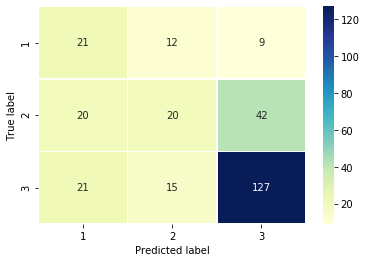

In [84]:
# Model Evaluation with Classification Report and Confusion Matrix
plot_eval(y_test, y_pred_6)

Accuracy: 0.729
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.56      0.66      0.61       210
           2       0.59      0.46      0.52       306
           3       0.82      0.85      0.84       786

    accuracy                           0.73      1302
   macro avg       0.66      0.66      0.65      1302
weighted avg       0.72      0.73      0.72      1302

------------------------------------------------------------
Confusion Matrix


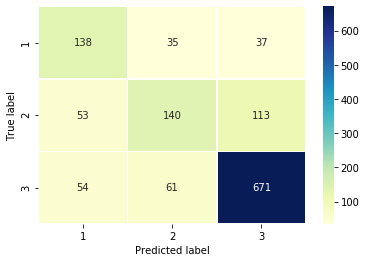

In [85]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_knn = knn.predict(X_train)
plot_eval(y_train, y_train_knn)

### Naive Bayes

In [86]:
# Naive Bayes

NB_Gauss = GaussianNB()

NB_Gauss.fit(X_train, y_train)

y_pred_7 = NB_Gauss.predict(X_test)

Accuracy: 0.23
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.26      0.71      0.38        42
           2       0.19      0.38      0.25        82
           3       0.71      0.03      0.06       163

    accuracy                           0.23       287
   macro avg       0.39      0.37      0.23       287
weighted avg       0.50      0.23      0.16       287

------------------------------------------------------------
Confusion Matrix


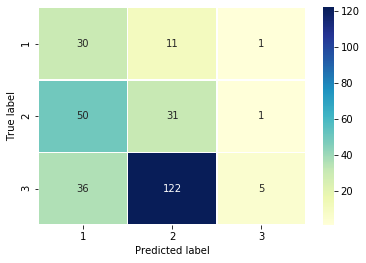

In [87]:
# Model Evaluation Naive Bayes
plot_eval(y_test, y_pred_7)

### SVC

In [88]:
# SVC
from sklearn.svm import SVC
SVC = SVC(kernel='rbf')
SVC.fit(X_train, y_train)

y_pred_8 = SVC.predict(X_test)

Accuracy: 0.62
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.42      0.52      0.47        42
           2       0.38      0.06      0.11        82
           3       0.68      0.93      0.78       163

    accuracy                           0.62       287
   macro avg       0.50      0.50      0.45       287
weighted avg       0.56      0.62      0.54       287

------------------------------------------------------------
Confusion Matrix


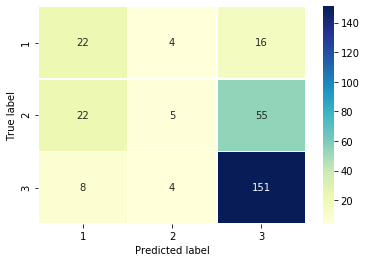

In [89]:
# Model Evaluation with SVC
plot_eval(y_test, y_pred_8)

Accuracy: 0.725
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.65      0.63      0.64       210
           2       0.70      0.19      0.30       306
           3       0.74      0.96      0.84       786

    accuracy                           0.73      1302
   macro avg       0.70      0.59      0.59      1302
weighted avg       0.72      0.73      0.68      1302

------------------------------------------------------------
Confusion Matrix


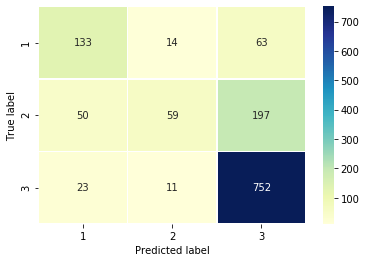

In [90]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_svc = SVC.predict(X_train)
plot_eval(y_train, y_train_svc)

### XGBoost

In [91]:
#XGBoost
from xgboost import XGBClassifier
XGBC = XGBClassifier()

#fitting model to train Data
XGBC.fit(X_train, y_train)

y_pred_9 = XGBC.predict(X_test)

Accuracy: 0.603
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.39      0.40      0.40        42
           2       0.36      0.12      0.18        82
           3       0.68      0.90      0.77       163

    accuracy                           0.60       287
   macro avg       0.47      0.47      0.45       287
weighted avg       0.54      0.60      0.55       287

------------------------------------------------------------
Confusion Matrix


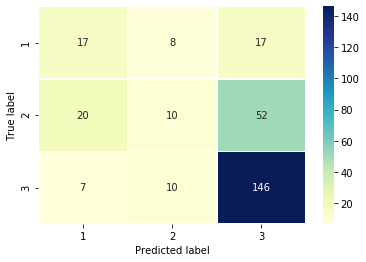

In [92]:
# Model Evaluation XGBoost
plot_eval(y_test, y_pred_9)

Accuracy: 0.763
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.70      0.65      0.68       210
           2       0.76      0.33      0.46       306
           3       0.78      0.96      0.86       786

    accuracy                           0.76      1302
   macro avg       0.75      0.65      0.66      1302
weighted avg       0.76      0.76      0.74      1302

------------------------------------------------------------
Confusion Matrix


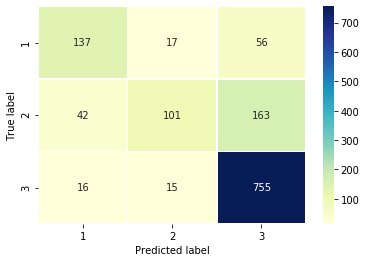

In [93]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_xgbc = XGBC.predict(X_train)
plot_eval(y_train, y_train_xgbc)

In [94]:
# Feature Importance XGBC
#feature_importance(XGBC)

### Stacking

In [95]:
# Stacking with mlxtend
from sklearn.svm import SVC
clf1 = LogisticRegression(max_iter=150)
clf2 = RandomForestClassifier(random_state=50, n_jobs = -1)
clf3 = SVC(random_state=50)
clf4 = DecisionTreeClassifier(random_state=50)
clf5 = KNeighborsClassifier()
clf6 = SGDClassifier(penalty='elasticnet', random_state=50)
lr = LogisticRegression() 

sclf = StackingCVClassifier(classifiers=[clf1, clf3, clf6],
                          meta_classifier=lr, random_state=50)

In [96]:
# Train stacking classifier
sclf.fit(X_train, y_train)

StackingCVClassifier(classifiers=[LogisticRegression(C=1.0, class_weight=None,
                                                     dual=False,
                                                     fit_intercept=True,
                                                     intercept_scaling=1,
                                                     l1_ratio=None,
                                                     max_iter=150,
                                                     multi_class='auto',
                                                     n_jobs=None, penalty='l2',
                                                     random_state=None,
                                                     solver='lbfgs', tol=0.0001,
                                                     verbose=0,
                                                     warm_start=False),
                                  SVC(C=1.0, break_ties=False, cache_size=200,
                                      class_weight=No

Accuracy: 0.634
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.46      0.60      0.52        42
           2       0.50      0.01      0.02        82
           3       0.68      0.96      0.79       163

    accuracy                           0.63       287
   macro avg       0.55      0.52      0.45       287
weighted avg       0.59      0.63      0.53       287

------------------------------------------------------------
Confusion Matrix


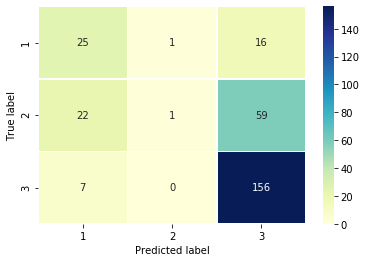

In [97]:
# Prediction and Evaluation of Test-Set 
y_pred_stack = sclf.predict(X_test)
plot_eval(y_test, y_pred_stack)

Accuracy: 0.676
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.55      0.59      0.57       210
           2       0.22      0.01      0.01       306
           3       0.71      0.96      0.81       786

    accuracy                           0.68      1302
   macro avg       0.49      0.52      0.47      1302
weighted avg       0.57      0.68      0.59      1302

------------------------------------------------------------
Confusion Matrix


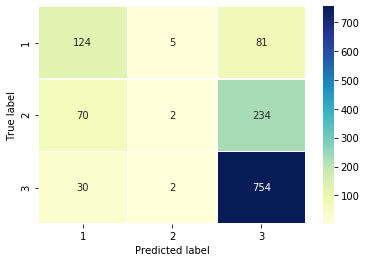

In [98]:
# Evaluation of Model on Training Data (Overfitting Test)
y_train_stack = sclf.predict(X_train)
plot_eval(y_train, y_train_stack)

### Optimizing Best Model with GridSearch

Since the SGDClassifier provided the best perfomance from the different test models, a Grid/RandomSearch was used to find the best combination of hyperparameters.

In [99]:
# Searching for best parameter combination for SGDClassifier
clf =  SGDClassifier()

# Hyperparameter grid
parameters = {
    'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'l1_ratio': list(np.arange(0.24, 0.26, 0.01)),
    'learning_rate': ['constant', 'optimal', 'invscaling'],
    'eta0': [0.1],
    'random_state': [50]
}

# Make a scoring object
#scorer = make_scorer(recall_score(y_test, y_pred_3, average='macro'))

# Create the random search model
grid_obj = RandomizedSearchCV(clf, parameters, n_jobs = -1, verbose=1, 
                        scoring = 'recall_weighted', cv = 3, 
                        n_iter = 200, random_state=50)

# Perform grid search on the classifier using 'scorer' as the scoring method
#grid_obj = GridSearchCV(clf, parameters, scoring='recall_weighted', n_jobs = -1, verbose=1, cv=3) 

# Fit the grid search object to the training data and find the optimal parameters
grid_fit = grid_obj.fit(X_train, y_train)

# Get the estimator
best_clf = grid_fit.best_estimator_ 

# Make predictions using the unoptimized and model
predictions = (clf.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf.predict(X_test) 

# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("Recall score on testing data: {:.4f}".format(recall_score(y_test, predictions, average='weighted')))
print("\nOptimized Model\n------")
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Final recall score on testing data: {:.4f}".format(recall_score(y_test, best_predictions, average='weighted')))
print(best_clf)


Fitting 3 folds for each of 135 candidates, totalling 405 fits


/Users/P_Neubert/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 135 is smaller than n_iter=200. Running 135 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   25.0s


Unoptimized model
------
Accuracy score on testing data: 0.6063
Recall score on testing data: 0.6063

Optimized Model
------
Final accuracy score on the testing data: 0.6132
Final recall score on testing data: 0.6132
SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.1, fit_intercept=True,
              l1_ratio=0.26, learning_rate='invscaling', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None,
              penalty='elasticnet', power_t=0.5, random_state=50, shuffle=True,
              tol=0.001, validation_fraction=0.1, verbose=0, warm_start=False)


[Parallel(n_jobs=-1)]: Done 398 out of 405 | elapsed:   31.9s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done 405 out of 405 | elapsed:   31.9s finished


In [100]:
# Showing possible hyperparameters 
# clf.get_params().keys()

In [101]:
# Best Paramter found with GridSearch
grid_obj.best_params_

{'random_state': 50,
 'penalty': 'elasticnet',
 'loss': 'hinge',
 'learning_rate': 'invscaling',
 'l1_ratio': 0.26,
 'eta0': 0.1}

## Final Test

A final test is conducted with the validation testset and the most promising model to validate its perfomance.

In [102]:
# Final test with validation testset

y_final = sgdc.predict(X_eval)

Accuracy: 0.537
------------------------------------------------------------
Classification Report
              precision    recall  f1-score   support

           1       0.38      0.28      0.33        46
           2       0.30      0.09      0.14        90
           3       0.59      0.90      0.71       145

    accuracy                           0.54       281
   macro avg       0.42      0.42      0.39       281
weighted avg       0.46      0.54      0.46       281

------------------------------------------------------------
Confusion Matrix


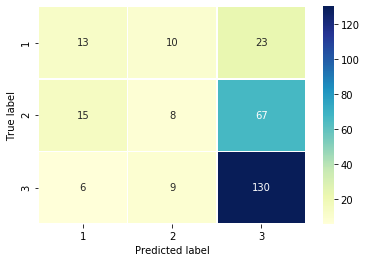

In [103]:
plot_eval(y_eval, y_final)

## Conclusion and Future Work

### Conclusion

We analyzed the dataset containing demographic information as well as information about personality traits and drug use. 
Based on the dataset we developed a classifier model to predict someone's vulnerabilty to certain drugs for prevention purpose. 


Our best model (so far) has a mediocre accuarcy and an weighted recall of ~0.65. 
This could (and should) be further improved, but since our intention is to discourage as many people as possible from taking drugs it is our main goal to identify the majority of the vulnerable users. 
With a recall for the class "Hard" drugs of ~0.96 our model performes quite well on those people. 
At this stage we can approve the overestimation of our model regarding potentially "Soft" and "Medium" drug users. 

    * accuracy and weighted recall ~0.65 is improvable
    * recall for class 3 ("Hard" drug users) ~0.96 supports our intention

### Future Work

* Reducing the complexity of the target variable to a binary problem
* Improving the model perfomance 
    * also incorporating the temporal aspect 
* Collecting new data to extend dataset 

Thanks for looking through the notebook. 

![](data/meme.jpg)